In [ ]:
!pip install noisereduce

In [ ]:
from google.colab import files
import sys
sys.path.append('/preprocessing')

In [ ]:
from preprocessing.AudioPreprocessor import AudioPreprocessor

In [ ]:
import kagglehub

# Загружаем датасет UrbanSound с Kaggle
path = kagglehub.dataset_download("chrisfilo/urbansound8k")

print("Path to dataset files:", path)

100%|██████████| 5.61G/5.61G [01:24<00:00, 71.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/chrisfilo/urbansound8k/versions/1


In [ ]:
%cp -r /root/.cache/kagglehub/datasets/chrisfilo/urbansound8k/versions/1 ./kaggle/

In [ ]:
!unzip "content/finetuned_ast_2024_12_08.zip" -d "content/finetuned_ast_2024_12_08"

Archive:  content/finetuned_ast_2024_12_08.zip
  inflating: content/finetuned_ast_2024_12_08/finetuned_ast_2024_12_08/config.json  
  inflating: content/finetuned_ast_2024_12_08/finetuned_ast_2024_12_08/model.safetensors  
  inflating: content/finetuned_ast_2024_12_08/finetuned_ast_2024_12_08/training_args.bin  


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pickle
import matplotlib.pyplot as plt
from IPython.display import Audio

import librosa
import librosa.display

In [ ]:
from transformers import AutoFeatureExtractor, ASTForAudioClassification, ASTFeatureExtractor
import torch

import matplotlib.pyplot as plt

class ast_model:
    def __init__(self, saved_model_path:str):
        """
        * `saved_model_path` - путь до папки с файлами для инициализации дообученной модели AST
        """

        self.model = ASTForAudioClassification.from_pretrained(saved_model_path)

        self.feature_extractor = ASTFeatureExtractor() # спектрограмма

        # with open('yamnet_classes.pickle', 'rb') as f:
        #     self.model_classes = pickle.load(f)

        self.model_classes = self.model.config.id2label
        self.label2id = self.model.config.label2id

        self.sample_rate = 16000

    def predict(self, wav:np.ndarray, top_n:int=5):
        """
        Делает общее предсказание для входного моно wav-файла частотой 16 кГц (необходимо для работы модели)

        * `wav` - waveform в формате `np.ndarray`
        * `top_n` - какое количество наиболее вероятных классов необходимо выдать
        """

        inputs = self.feature_extractor(wav, sampling_rate=self.sample_rate, return_tensors="pt")

        with torch.no_grad():
            outputs = self.model(**inputs).logits

        sm = torch.nn.Softmax(dim=1)

        class_probabilities = sm(outputs).numpy()[0]

        top_class_indices = np.argsort(class_probabilities)[::-1][:5]

        return [self.model_classes[i] for i in top_class_indices], np.array(class_probabilities)[top_class_indices]

    def predict_with_explain(self, wav:np.ndarray, k:int=1, top_n:int=5):
        """
        Делает общее предсказание для входного моно wav-файла частотой 16 кГц (необходимо для работы модели).
        Производит предсказания для частей входного wav-файла длиной `k` секунд для определения, какие части
        оказали наибольшее влияние

        * `wav` - waveform в формате `np.ndarray`
        * `k` - длина интервала в секундах
        * `top_n` - какое количество наиболее вероятных классов необходимо выдать
        """

        # audio, sr = librosa.load(path_to_wav_file, sr=sample_rate, mono=True)

        # Шаг 2: Расчет количества сэмплов для интервала k
        segment_samples = k * self.sample_rate

        # Шаг 3: Нарезка аудио на части длиной k
        segments = [
            wav[i:i + segment_samples]
            for i in range(0, len(wav), segment_samples)
        ]

        # Делаем паддинг для последнего сегмента
        segments[-1] = np.pad(segments[-1], (0, max(0, segment_samples - len(segments[-1]))))

        # итеративно прогоняем каждый сегмент через модель
        segments_results = []
        for segment in segments:

            # segment_tensor = tf.convert_to_tensor(segment, dtype=tf.float32)

            # Отправляем сегмент в модель
            # result = self.model(segment_tensor)

            inputs = self.feature_extractor(segment, sampling_rate=self.sample_rate, return_tensors="pt")

            with torch.no_grad():
                outputs = self.model(**inputs).logits

            sm = torch.nn.Softmax(dim=1)
            class_probabilities = sm(outputs).numpy()[0]

            segments_results.append(class_probabilities)


        segments_results = np.array(segments_results)

        # делаем предсказание для всего файла
        total_classes, total_probabilities = self.predict(wav, top_n=top_n)

        top_class_indices = [self.label2id[class_i] for class_i in total_classes]

        top_n_segments_results = segments_results[:, top_class_indices]

        # Создаём график с указанием, наиболее влияющих участков для каждого класса

        # Создание фигуры и осей
        fig, ax = plt.subplots(figsize=(10, 6))

        # Визуализация сегментов для топ-N классов
        cax = ax.imshow(
            top_n_segments_results.T,
            aspect='auto',
            interpolation='nearest',
            cmap='gray_r'
        )

        # Настройка осей
        yticks = range(0, top_n)
        ax.set_yticks(yticks)
        ax.set_yticklabels([self.model_classes[idx] for idx in top_class_indices])
        ax.set_ylim(-0.5 + np.array([top_n, 0]))  # Настройка лимитов по y

        # Добавление цветовой шкалы
        fig.colorbar(cax, ax=ax, orientation='vertical', label='Probability')

        # Возврат объекта фигуры
        return total_classes, total_probabilities, top_n_segments_results, fig

In [ ]:
model_test = ast_model('content/finetuned_ast_2024_12_08')

In [ ]:
!unzip "background.zip" -d "background"

Archive:  background.zip
   creating: background/background/
  inflating: background/background/bird_bg01.wav  
  inflating: background/background/bird_bg02.wav  
  inflating: background/background/bird_bg03.wav  
  inflating: background/background/bird_bg04.wav  
  inflating: background/background/bird_bg05.wav  
  inflating: background/background/bird_bg06.wav  
  inflating: background/background/bird_bg07.wav  
  inflating: background/background/bird_bg08.wav  
  inflating: background/background/bird_bg09.wav  
  inflating: background/background/bird_bg10.wav  
  inflating: background/background/bird_bg11.wav  
  inflating: background/background/bird_bg12.wav  
  inflating: background/background/bird_bg13.wav  
  inflating: background/background/bird_bg14.wav  
  inflating: background/background/bird_bg15.wav  
  inflating: background/background/bird_bg16.wav  
  inflating: background/background/bird_bg17.wav  
  inflating: background/background/bird_bg18.wav  
  inflating: backgrou

In [ ]:
import pandas as pd


df = pd.read_csv('kaggle/UrbanSound8K.csv')
df['filenames'] = 'kaggle/fold' + df['fold'].astype(str) + '/' + df['slice_file_name'].astype(str)

In [ ]:
for_test = df.sample()

wav_file_name = for_test['filenames'].iloc[0]
classs_true = for_test['class'].iloc[0]

print(wav_file_name, classs_true)

Audio(wav_file_name)

kaggle/fold1/98223-7-4-0.wav jackhammer


In [ ]:
feature_extractor = ASTFeatureExtractor()
wav_file_name_2 = 'gorodskoe-dvijenie1.wav'
audio, sr = librosa.load(wav_file_name_2, sr=16000, mono=True)
example = AudioPreprocessor(audio, sr)
#model_test.predict(audio)

In [ ]:
import os
import random

directory = 'background/background/'

wav_files = [f for f in os.listdir(directory) if f.endswith('.wav')]

selected_file = random.choice(wav_files)

wav_file_name_3 = os.path.join(directory, selected_file)

audio_3, sr_3 = librosa.load(wav_file_name_3, sr=16000, mono=True)

In [ ]:
Audio(data=audio_3, rate=sr_3)

In [ ]:
example_3 = AudioPreprocessor(audio_3, sr_3)

In [ ]:
example_3 = example_3.preprocessing_auto_pipeline()

In [ ]:
audio_3, sr_3 = example_3.return_audio()

(['dog_bark',
  'children_playing',
  'air_conditioner',
  'street_music',
  'gun_shot'],
 array([9.9690789e-01, 2.2525422e-03, 4.2812381e-04, 3.1990037e-04,
        3.8826718e-05], dtype=float32),
 array([[9.95146453e-01, 5.02174895e-04, 1.95106637e-04, 1.39086085e-04,
         2.75140675e-03],
        [9.94774163e-01, 2.40673032e-03, 1.08578977e-04, 3.21160798e-04,
         9.38045909e-04],
        [9.99981403e-01, 1.23815971e-06, 1.15000694e-06, 1.59589877e-06,
         4.67559221e-06],
        [8.41789544e-01, 5.58498129e-02, 2.15821108e-03, 2.57617179e-02,
         3.17276716e-02],
        [9.51991379e-01, 2.29216437e-03, 3.64520936e-03, 1.23767147e-03,
         2.06798874e-02],
        [9.99825776e-01, 1.34494221e-05, 8.96534038e-06, 1.50607566e-05,
         6.81882957e-05],
        [9.99688387e-01, 1.67155995e-05, 7.57145654e-06, 3.98548291e-05,
         4.88756050e-05],
        [4.60419327e-01, 9.29840878e-02, 2.03229412e-02, 2.57382225e-02,
         6.24851137e-02],
        [9

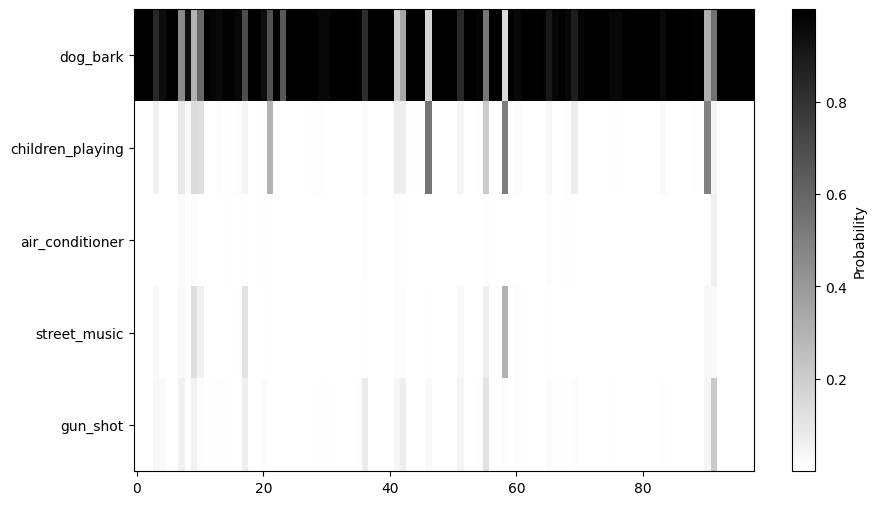

In [ ]:
model_test.predict_with_explain(audio_3)

In [ ]:
Audio(wav_file_name_2)

In [ ]:
Audio(data=audio, rate=sr)

In [ ]:
example.preprocessing_auto_pipeline()

In [ ]:
example_2 = example.preprocessing_auto_pipeline()

In [ ]:
audio_2, sr_2 = example_2.return_audio()

In [ ]:
audio, sr

(array([-4.0220625e-06, -2.7182182e-06,  1.1417061e-06, ...,
         9.0924982e-07, -1.0913229e-06,  0.0000000e+00], dtype=float32),
 16000)

In [ ]:
audio_2, sr_2

(memmap([5.4305003e-14, 5.5859011e-14, 5.7403674e-14, ..., 7.2796513e-07,
         6.6310025e-07, 6.0078361e-07], dtype=float32),
 16000)

In [ ]:
Audio(data=audio_2, rate=sr_2)

(['street_music',
  'children_playing',
  'car_horn',
  'jackhammer',
  'engine_idling'],
 array([9.2830747e-01, 7.1232058e-02, 1.8973081e-04, 1.0715243e-04,
        9.2543014e-05], dtype=float32),
 array([[1.38873804e-06, 4.68660460e-07, 9.99915957e-01, 5.90663035e-07,
         4.44491525e-06],
        [1.04206072e-06, 3.11445774e-07, 9.99984503e-01, 8.77648745e-07,
         3.94500967e-06],
        [4.78919392e-04, 1.33748530e-04, 8.08027610e-02, 7.03207433e-01,
         2.99245276e-05],
        [2.78122970e-05, 5.73535408e-06, 1.21333532e-03, 9.97631907e-01,
         2.60595380e-06],
        [2.92595068e-05, 8.18612716e-06, 1.19740624e-04, 9.95850801e-01,
         2.17823799e-05],
        [1.10976060e-03, 8.72229517e-01, 1.20743677e-01, 1.06935579e-04,
         3.65471060e-05],
        [2.41166272e-04, 4.56776297e-06, 9.99592721e-01, 3.58674879e-06,
         4.49973243e-07],
        [2.39645061e-03, 6.90140605e-01, 2.07166100e-04, 3.06177944e-01,
         1.00950732e-04],
        [3

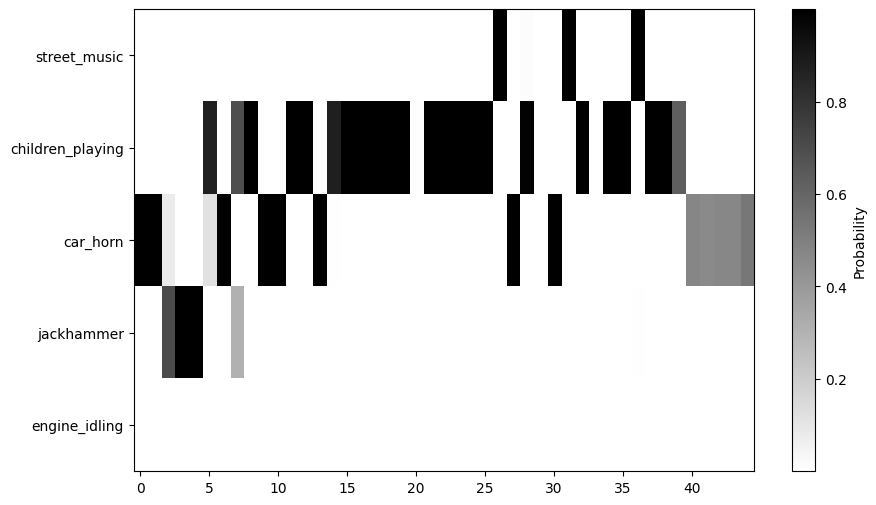

In [ ]:
model_test.predict(audio)
model_test.predict_with_explain(audio)

(['children_playing', 'street_music', 'dog_bark', 'car_horn', 'jackhammer'],
 array([6.6881233e-01, 3.2707894e-01, 2.5319802e-03, 6.5186602e-04,
        2.8548087e-04], dtype=float32),
 array([[4.78288541e-07, 2.80181183e-07, 9.99995470e-01, 9.64128731e-07,
         8.60536773e-07],
        [1.14138402e-06, 1.31479521e-06, 1.69719406e-05, 9.99962330e-01,
         9.95585992e-07],
        [6.67706672e-07, 7.00804378e-07, 9.99990225e-01, 2.04277512e-06,
         1.10257372e-06],
        [2.49787103e-02, 5.96351281e-04, 9.62304354e-01, 6.05299487e-04,
         2.19675741e-04],
        [1.53380551e-03, 1.29082837e-04, 9.96809304e-01, 5.70390082e-04,
         5.30748584e-05],
        [6.81495806e-07, 1.51582739e-07, 9.99995112e-01, 1.58142905e-06,
         5.05438209e-07],
        [2.77945878e-06, 3.44740442e-06, 9.99378920e-01, 5.34192019e-04,
         2.85321380e-06],
        [1.44759333e-03, 6.24877648e-05, 9.96609092e-01, 9.59740661e-04,
         5.87377763e-05],
        [7.42175460e-01

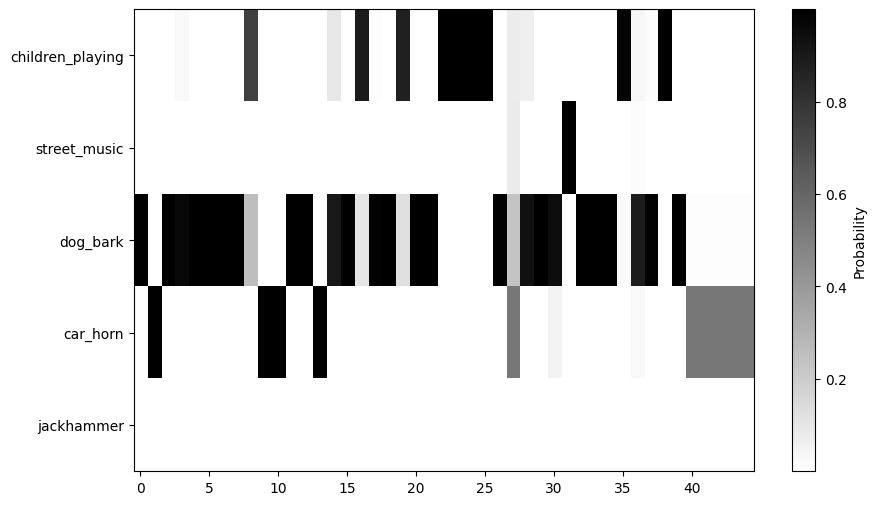

In [ ]:
model_test.predict(audio_2)
model_test.predict_with_explain(audio_2)